### Information Extraction Cleaned up


In [1]:
from collections import defaultdict, Counter
import re
import os
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import pandas as pd
from sklearn.feature_extraction import DictVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score, classification_report
import numpy as np
from nltk import sent_tokenize
from nltk.corpus import stopwords
from itertools import chain
import key_functions as kf
import math
import pickle
import pandas as pd
from sklearn.linear_model import LogisticRegression


In [8]:

# Training for damages
dmg_model, dmg_vectorizer,case_damages = kf.train_classifier('../data/annotations/all_annotations_CN.txt', clf = LogisticRegression(C = 1, penalty='l2', solver = 'newton-cg', max_iter = 600, random_state=42),context_length = 5, min_para_score = 0, min_predict_proba = 0.5)

Didnt find any tags in Mawani v. Pitcairn, [2012] B.C.J. No. 1819
Didnt find any tags in Aiken (Guardian ad litem of) v. Van Dyk, [2001] B.C.J. No. 1751
Didnt find any tags in Millard v. Singleton, [2015] B.C.J. No. 1234 %
Didnt find any tags in Cowie v. Draper, [2010] B.C.J. No. 910935154 %
Didnt find any tags in Bajwa v. Deol, [2018] I.L.R. para. G-2792606 %
Didnt find any tags in Jackson v. Fisheries and Oceans Canada, [2006] B.C.J. No. 2654
Didnt find any tags in Los Angeles Salad Co. v. Canadian Food Inspection Agency, [2009] B.C.J. No. 161
Didnt find any tags in Brooks-Martin v. Martin, [2011] B.C.J. No. 243
Didnt find any tags in Gibson v. Matthies, [2017] B.C.J. No. 96556 %
Didnt find any tags in Gray v. Ellis, [2007] I.L.R. para. M-211801 %
Didnt find any tags in Morrow v. Outerbridge, 2009 CHFL para. 15,554
Didnt find any tags in Rackstraw (Litigation guardian of) v. Robertson, [2011] B.C.J. No. 1354
Didnt find any tags in Ahlwat v. Green, [2014] B.C.J. No. 245267576 %
Didnt 

//anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  % (min_groups, self.n_splits)), UserWarning)
//anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
//anaconda3/lib/python3.7/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
//anaconda3/lib/python3.7/site-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
//anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
//anaconda3/lib/pyt

Cross validation evaluation...
                      precision    recall  f1-score   support

          aggravated       0.64      0.33      0.44        21
         future care       0.76      0.68      0.72       243
    future wage loss       0.64      0.66      0.65       238
             general       0.62      0.51      0.56        87
            in trust       0.45      0.13      0.20        38
       non pecuniary       0.76      0.81      0.78       344
               other       0.84      0.95      0.89      2987
      past wage loss       0.68      0.69      0.69       232
            punitive       0.80      0.62      0.70        39
        reduction by       0.86      0.38      0.52        16
        reduction to       0.67      0.15      0.25        26
             special       0.66      0.77      0.71       257
     sub-future care       0.33      0.03      0.05        78
sub-future wage loss       0.17      0.03      0.05        37
         sub-general       0.00      0

//anaconda3/lib/python3.7/site-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)


In [9]:
with open('../code/best_model_niki.pkl', 'wb') as file:
    pickle.dump(dmg_model, file)
    
with open('../code/best_vectorizer_niki.pkl', 'wb') as file:
    pickle.dump(dmg_vectorizer, file)
    

In [10]:
path = '/users/niki/Documents/Capstone-project/data/Lexis Cases txt/'
predictions = dict()

file_prefix = 'P'
file_suffix = '.txt'
file_identifiers = range(1, 86) # Range from 1 to 85

case_type_counts = defaultdict(int)
for file_number in file_identifiers:

    print('Processing ' + file_suffix)
    with open(path + file_prefix + str(file_number) + file_suffix, encoding='utf-8') as document:
        document_data = document.read()
        document_data = document_data.split('End of Document\n') 

        num_cases = len(document_data)
        for i in range(num_cases):
            print('Reading data and extracting features...', i / num_cases * 100, '%', end='\r')
            case = document_data[i]
            case = case.strip() 
            if len(case) == 0: # Skip empty lines
                continue

            lines = case.split('\n')
            case_title = lines[0]
            case_type = lines[1]
            predictions[case_title] = kf.predict(case, dmg_model, dmg_vectorizer)

Processing .txt
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%% 80.3921568627451 %
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting features... 98.0392156862745 %%% 60.78431372549019 %
Processing .txtd extracting features... 98.0392156862745 %%% %
Processing .txtd extracting features... 98.0392156862745 %%%
Processing .txtd extracting 

In [11]:
path = "/users/niki/Documents/Capstone-project/data/Lexis Cases txt/"
file_prefix = 'P'
file_suffix = '.txt'
file_identifiers = range(1, 86) # Range from 1 to 85

clf_results = []
for file_number in file_identifiers:
    print('## Processing ' + path + file_prefix + str(file_number) + file_suffix + ' ##', end='\r')
    
    # Pass the model to the rule_based_parse_BCJ function
    # This will use rule based for columns such as judge name, etc. but classifier for damages/CN
    
    # To use rule based for damage/CN do not pass the model/vectorizer.
    clf_results.extend(kf.rule_based_parse_BCJ(path + file_prefix + str(file_number) + file_suffix, dmg_model, dmg_vectorizer,annotated_damages = {}, cn_model = None, cn_vectorizer = None, annotated_cn = None, min_predict_proba = 0.5, high_precision_mode = False, include_no_damage_cases = False))
    

In [26]:
df

,Case Number,Case Name,Year,Total Damage,Total Pecuniary,Non Pecuniary,General,Special,Punitive,Aggravated,Future Care,Judge Name,Decision Length,Multiple defendants?,Plaintiff Wins?,Contributory Negligence Raised,Written Decision?,Registry,Contributory Negligence Successful,Percent Reduction
0,1 of 1,"Mawani v. Pitcairn, [2012] B.C.J. No. 1819",2012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,S.F. Kelleher J.,115,Y,Y,True,True,Vancouver,True,0.50
1,2 of 1,"Ediger (Guardian ad litem of) v. Johnston, [20...",2009,3224000.00,2580000.00,260000.0,590000.0,40000.00,NaN,NaN,1950000.0,H.J. Holmes J.,350,N,Y,False,True,Vancouver,False,NaN
2,3 of 1,"Furness v. Guest, [2010] B.C.J. No. 1388",2010,41020.70,1020.70,40000.0,NaN,1020.70,NaN,NaN,NaN,D.A. Halfyard J.,97,Y,Y,True,True,Nanaimo,True,0.75
3,4 of 1,"Howell v. Machi, [2017] B.C.J. No. 2016",2017,NaN,2078781.77,215000.0,2050000.0,28781.77,100000.0,NaN,NaN,H. MacNaughton,525,Y,Y,True,True,Vancouver,True,0.25
4,5 of 1,"Morrow v. Outerbridge, [2009] B.C.J. No. 640",2009,200000.00,2706543.59,NaN,2451229.0,255314.59,NaN,NaN,NaN,E.A. Bennett J.,311,Y,Y,False,True,Vancouver,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2376,4227 of 85,"Sull Estate v. Pengelly, [2019] B.C.J. No. 1756",2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P.G. Voith J.,64,Y,Y,False,True,Vancouver,False,NaN
2377,4230 of 85,True Colors Painting Ltd. v. 0846747 BC Ltd. (...,2015,46954.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J.R. Dillon J.,66,Y,Y,False,True,Vancouver,False,NaN
2378,4234 of 85,"Williams-Quitzau v. Chow, [2010] B.C.J. No. 2979",2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Master M.E. Shaw (In Chambers),44,N,Y,True,True,Vancouver,False,NaN
2379,4235 of 85,"Willson v. Angela Gibson Law Corp., [2008] B.C...",2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Heard: August 29 (written submissions of the,10,Y,Y,False,True,Vancouver,False,NaN


In [29]:
gold_df = pd.read_csv('../data/annotations/Case_Annotation.csv',error_bad_lines=False)#, #skiprows = lambda x: x in range(1, 100))

gold_df.dropna(how = 'all', inplace=True) 

# df = kf.rule_based_convert_cases_to_DF(clf_results)
           


# key_functions.evaluate(df_all[['Case Name','Future Care']], gold, focus_column='Future Care')

In [210]:
df = kf.rule_based_convert_cases_to_DF(clf_results)

df['Contributory Negligence Successful'].replace(np.nan, False, inplace = True)
df['Contributory Negligence Raised'].replace(np.nan, False, inplace = True)
df


,Case Number,Case Name,Year,Total Damage,Total Pecuniary,Non Pecuniary,General,Special,Punitive,Aggravated,Future Care,Judge Name,Decision Length,Multiple defendants?,Plaintiff Wins?,Contributory Negligence Raised,Written Decision?,Registry,Contributory Negligence Successful,Percent Reduction
0,1 of 1,"Mawani v. Pitcairn, [2012] B.C.J. No. 1819",2012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,S.F. Kelleher J.,115,Y,Y,True,True,Vancouver,True,0.50
1,2 of 1,"Ediger (Guardian ad litem of) v. Johnston, [20...",2009,3224000.00,2580000.00,260000.0,590000.0,40000.00,NaN,NaN,1950000.0,H.J. Holmes J.,350,N,Y,False,True,Vancouver,False,NaN
2,3 of 1,"Furness v. Guest, [2010] B.C.J. No. 1388",2010,41020.70,1020.70,40000.0,NaN,1020.70,NaN,NaN,NaN,D.A. Halfyard J.,97,Y,Y,True,True,Nanaimo,True,0.75
3,4 of 1,"Howell v. Machi, [2017] B.C.J. No. 2016",2017,NaN,2078781.77,215000.0,2050000.0,28781.77,100000.0,NaN,NaN,H. MacNaughton,525,Y,Y,True,True,Vancouver,True,0.25
4,5 of 1,"Morrow v. Outerbridge, [2009] B.C.J. No. 640",2009,200000.00,2706543.59,NaN,2451229.0,255314.59,NaN,NaN,NaN,E.A. Bennett J.,311,Y,Y,False,True,Vancouver,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2376,4227 of 85,"Sull Estate v. Pengelly, [2019] B.C.J. No. 1756",2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P.G. Voith J.,64,Y,Y,False,True,Vancouver,False,NaN
2377,4230 of 85,True Colors Painting Ltd. v. 0846747 BC Ltd. (...,2015,46954.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,J.R. Dillon J.,66,Y,Y,False,True,Vancouver,False,NaN
2378,4234 of 85,"Williams-Quitzau v. Chow, [2010] B.C.J. No. 2979",2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Master M.E. Shaw (In Chambers),44,N,Y,True,True,Vancouver,False,NaN
2379,4235 of 85,"Willson v. Angela Gibson Law Corp., [2008] B.C...",2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Heard: August 29 (written submissions of the,10,Y,Y,False,True,Vancouver,False,NaN


#### filter year 2020

In [211]:
df = df[df.Year != '2020']  


In [212]:

def inflation_adjust(dataframe, r1, r2):
    '''Function takes in a dataframe and multiply selected rows by inflation rate
    df --- DataFrame
    r1 --- Index of the start row in the range
    r2 --- Index of the end row in the range'''
    dataframe['Year'] = dataframe['Year'].astype(str)
    dataframe = dataframe[dataframe.Year != '2020']  
    df = dataframe.dropna(how='all')
    # check to see if the indices are intigers and are within data fram range
    assert isinstance(r1, int) and isinstance(r2, int) and r1 >= 0 and r2 <= len(df.columns)
    # Check to see if the columns selected are not float or int type
#     for col in df.iloc[:,r1:r2]:
#         if df[col].dtype != "float64" or df[col].dtype != "int64":
#             print("column {} is not numerical type".format(df[col]))
            
        
    inflection_dict = {"2000":1.4392,"2001":1.3906, "2002":1.3668,
                       "2003":1.3281, "2004":1.3064, "2005":1.2758, 
                       "2006":1.2454, "2007":1.2186, "2008":1.1982, 
                       "2009":1.1940, "2010":1.1724, "2011":1.1352, 
                       "2012":1.1129, "2013":1.1084,"2014":1.0863, 
                       "2015":1.0777, "2016":1.06, "2017":1.0429, 
                       "2018":1.0203, "2019":1.0}
  

    df["scaler"] = df['Year'].map(inflection_dict)
    df.iloc[:,r1:r2] = df.iloc[:,r1:r2].mul(df["scaler"], axis = 0)
    return df


        
        
inflation_df = inflation_adjust(df, 3, 11)


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Visualization functions:

In [34]:
def return_feature_heatmap(n, model, vectorizer, features_subset = None):
    '''Given a model and vectorizer function gives the heatmap with category on y-axis and features on x-axis
    n -- Number of features
    model -- trained model
    vectorizer --fit-transformed vectorizer '''
    features_dict = defaultdict(dict)
    indices = []
    for i, category in enumerate(model.classes_):
        if features_subset:
            if category not in features_subset:
                continue
        feature_weights = model.coef_[i]
        features_dict[category]['feature'] = []
        features_dict[category]['weight'] = []
        idx = (-feature_weights).argsort()[:n]
        indices.extend(idx)
    for idx in indices:
        for i, category in enumerate(model.classes_):
            if features_subset:
                if category not in features_subset:
                    continue
            if 'feature' not in features_dict[category] or 'weight' not in features_dict[category]:
                continue
            features_dict[category]['feature'].append(vectorizer.feature_names_[idx])
            features_dict[category]['weight'].append(model.coef_[i][idx])
    features =[ features_dict[cat]['feature'] for cat in features_dict]
    features = list(chain.from_iterable(features))
    categories = [[cat]*len(features_dict[cat]['feature']) for cat in features_dict]
    categories = list(chain.from_iterable(categories))
    weight =[features_dict[cat]['weight'] for cat in features_dict]
    weight = list(chain.from_iterable(weight))
    features_df = pd.DataFrame({'Category': categories, 'Features': features, 'Weights': weight})
    heat_map = alt.Chart(features_df).mark_rect().encode(
    alt.X('Features:N', bin=False, sort=None),
    alt.Y("Category:N", sort=alt.EncodingSortField(field='Category', order='ascending')),
    color='Weights:Q')
    return heat_map

In [36]:
return_feature_heatmap(5, dmg_model, dmg_vectorizer, features_subset = None)

In [144]:
def Altair_bar_chart(dataframe, X, Y, group_by=None , y_title="" ,x_title= "", Title = "", Width= 900, Height = 300 ):
    '''
    Function takes data frame and produces Altair bar graphs (or grouped graph)
    
    X -- The x-axis values (str) (!!! CAUTION : place the type of the data beside x) 
        Example:'Year:O'
    Y -- The y-axis values (str) (!!! CAUTION : place the type of the data beside y)        
        Example: 'Median(Total Damage):Q'
    
    Optional variables:
    
    group_by -- Choosing the "color" of the graph, what coloum want to group by (str) 
        Example: 'Year:O'
   
    x_title -- X-axis title (str)
    y_title -- Y-axis title (str)
    title -- graph title (str)
    Width -- graph width (int)
    Height -- graph height (int) 
    
    
    Types of Data to place beside x and y:
    quantitative(Q) = Number
    nominal(N) = Unordered Categorical
    ordinal(O) = Ordered Categorical
    temporal(T) = Date/Time
    
    '''
    if group_by == None:
        chart = alt.Chart(dataframe).mark_bar().encode(
        x=alt.X(X, axis=alt.Axis(title= x_title)),
        y=alt.Y(Y, axis=alt.Axis(title= y_title))
        ).properties(width= Width, height=Height, title=Title
        )
        return chart
    else:
        chart = alt.Chart(dataframe).mark_bar().encode(
        x=alt.X(X, axis=alt.Axis(title= x_title)),
        y=alt.Y(Y, axis=alt.Axis(title= y_title)),
        color = group_by
        ).properties(width= Width, height=Height, title=Title
        )
        return chart

In [198]:
def smooth_dataframe_column(df, col_name, window_size = 3):
    '''Make smoothed numbers for given dataframe column
    df -- Dataframe
    col_name -- column which want to smooth
    window_size -- the odd number intervals to smooth by'''
    if window_size % 2 == 0 or window_size < 3:
        print('Error: Window should be an odd number (min. 3)')
        return None
    new_values = []
    col_values = list(df[col_name])
    w = window_size // 2
    for i in range(len(col_values)):
        values = list(col_values[i-w:i])
        values.extend(col_values[i:i+w+1])
        new_values.append(np.mean(values))
    df[col_name] = new_values
    return df

### Visualizations: 

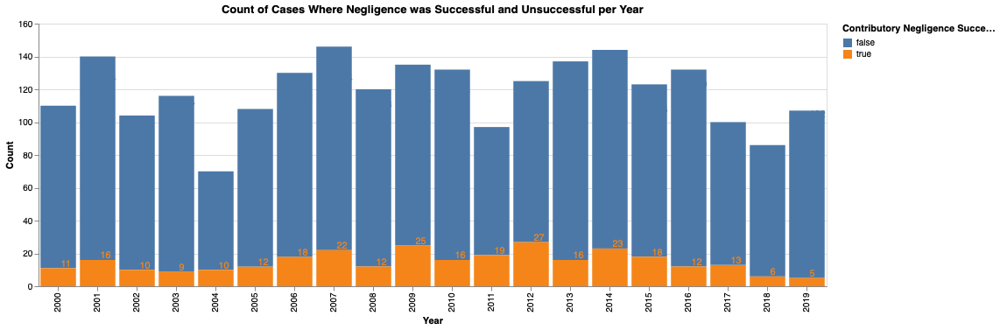

In [153]:
A = Altair_chart(inflation_df, 'Year:O', 'count(Contributory Negligence Successful):Q', 'Contributory Negligence Successful:N' 
             , y_title= "Count"
             ,x_title= "Year", Title = 'Count of Cases Where Negligence was Successful and Unsuccessful per Year' 
             , Width= 900, Height = 300 )

text = A.mark_text(
    align='left',
    baseline='bottom',
    color= 'red',
    dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='count(Contributory Negligence Successful):Q')

A+text

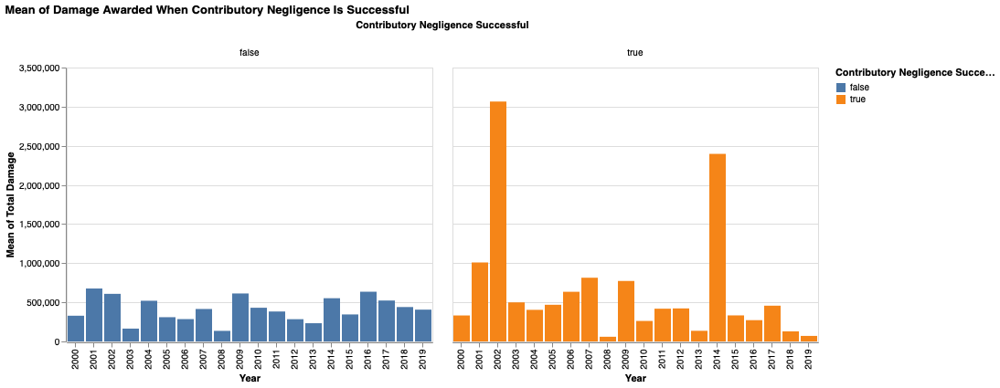

In [384]:
success = alt.Chart(inflation_df[inflation_df['Total Damage'] < 20000000]).mark_bar().encode(
    alt.X('Year:O'),
    y='mean(Total Damage):Q',
    color = 'Contributory Negligence Successful:N',
    column = 'Contributory Negligence Successful:N'
).properties(title='Mean of Damage Awarded When Contributory Negligence Is Successful'
    )
rule = alt.Chart(inflation_df).mark_rule(color='red').encode(
    y='median(Total Damage):Q'
)
success


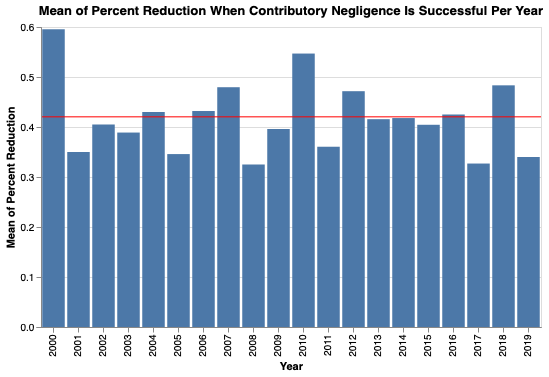

In [158]:
B = Altair_bar_chart(inflation_df[inflation_df['Contributory Negligence Successful']==True], 'Year:O',
                     'mean(Percent Reduction):Q',
                     y_title="Mean of Percent Reduction" ,x_title= "Year", Title = 'Mean of Percent Reduction When Contributory Negligence Is Successful Per Year'
                     ,Width= 500, Height = 300 )


rule = alt.Chart(inflation_df).mark_rule(color='red').encode(
    y='mean(Percent Reduction):Q'
)

B+rule

In [186]:
C = Altair_bar_chart(inflation_df, 'Year:O',
                     'mean(Total Damage):Q',
                     y_title= 'Mean Total Damage',x_title= "Year", Title ="Mean of Total Damage Awarded Per Year"
                     ,Width= 500, Height = 300 )
C_rule = alt.Chart(inflation_df).mark_rule(color='red').encode(
    y='mean(Total Damage):Q'
)

C+C_rule;

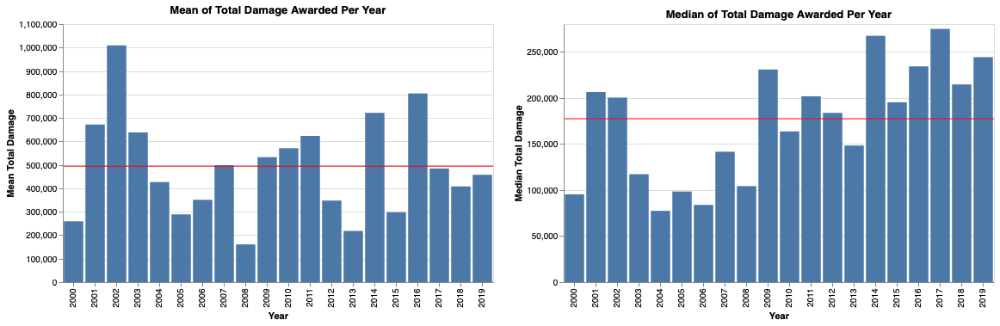

In [185]:
D = Altair_bar_chart(inflation_df, 'Year:O',
                     'median(Total Damage):Q',
                     y_title= 'Median Total Damage',x_title= "Year", Title ="Median of Total Damage Awarded Per Year"
                     ,Width= 500, Height = 300 )
D_rule = alt.Chart(inflation_df).mark_rule(color='red').encode(
    y='median(Total Damage):Q'
)

C+C_rule|D +D_rule

#### damages per year

Text(0.5, 1.0, 'Mean Total Damage per year')

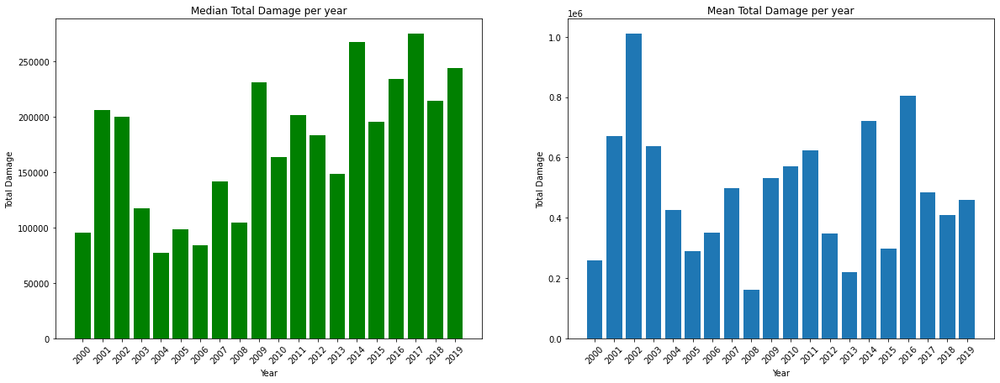

In [187]:
plt.figure(figsize=(20,7))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Total Damage'], color = 'green')
plt.xlabel('Year')
plt.ylabel('Total Damage')
plt.xticks(rotation=45)
plt.title('Median Total Damage per year')

ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Total Damage'])
plt.xlabel('Year')
plt.ylabel('Total Damage')
plt.xticks(rotation=45)
plt.title('Mean Total Damage per year')


Text(0.5, 1.0, 'Median Total Non Pecuniary Damage per year')

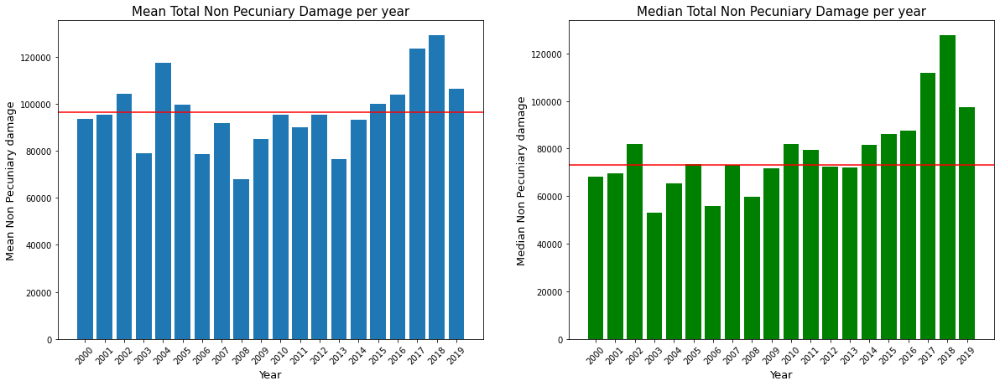

In [188]:
plt.figure(figsize=(20,7))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Non Pecuniary'])
plt.xlabel('Year',fontsize=13)
plt.ylabel('Mean Non Pecuniary damage',fontsize=13)
plt.axhline(df_grouped['Non Pecuniary'].mean(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Mean Total Non Pecuniary Damage per year',fontsize=15)



ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Non Pecuniary'],color = 'green')
plt.xlabel('Year',fontsize=13)
plt.ylabel('Median Non Pecuniary damage',fontsize=13)
plt.axhline(df_grouped['Non Pecuniary'].median(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Median Total Non Pecuniary Damage per year',fontsize=15)



Text(0.5, 1.0, 'Median Total Pecuniary Damage per year')

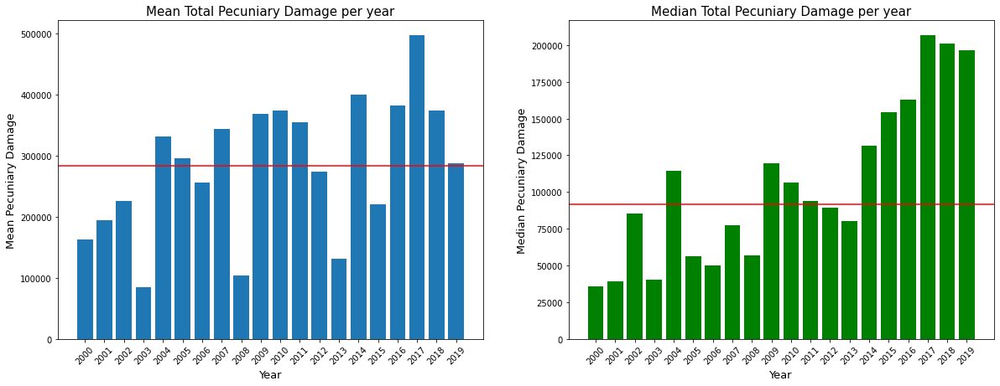

In [189]:
plt.figure(figsize=(20,7))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Total Pecuniary'])
plt.xlabel('Year',fontsize=13)
plt.ylabel('Mean Pecuniary Damage',fontsize=13)
plt.axhline(df_grouped['Total Pecuniary'].mean(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Mean Total Pecuniary Damage per year',fontsize=15)

ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Total Pecuniary'], color = "green")
plt.xlabel('Year',fontsize=13)
plt.ylabel('Median Pecuniary Damage',fontsize=13)
plt.axhline(df_grouped['Total Pecuniary'].median(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Median Total Pecuniary Damage per year',fontsize=15)



Text(0.5, 1.0, 'Median Total General Damage per year')

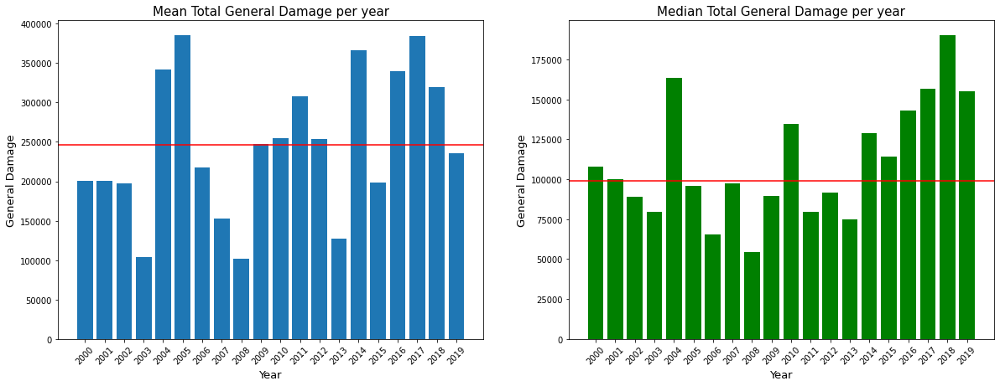

In [190]:
plt.figure(figsize=(20,7))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['General'])
plt.axhline(df_grouped['General'].mean(), color='r', linestyle='-')
plt.xlabel('Year',fontsize=13)
plt.ylabel('General Damage',fontsize=13)
plt.xticks(rotation=45)
plt.title('Mean Total General Damage per year',fontsize=15)


ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['General'], color = "green")
plt.xlabel('Year',fontsize=13)
plt.ylabel('General Damage',fontsize=13)
plt.axhline(df_grouped['General'].median(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Median Total General Damage per year',fontsize=15)

Text(0.5, 1.0, 'Median Total Future Care Damage per year')

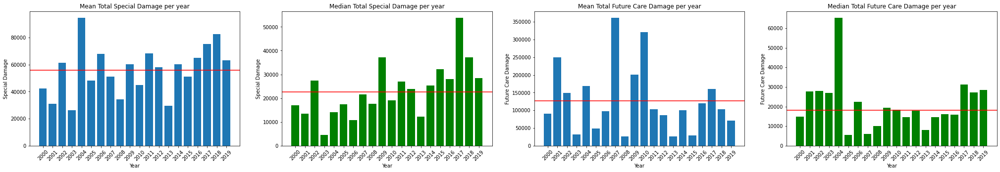

In [191]:
plt.figure(figsize=(35,5))
ax = plt.subplot(1, 4, 1)

df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Special'])
plt.xlabel('Year')
plt.ylabel('Special Damage')
plt.xticks(rotation=45)
plt.axhline(df_grouped['Special'].mean(), color='r', linestyle='-')
plt.title('Mean Total Special Damage per year')

ax = plt.subplot(1, 4, 2)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Special'], color = "green")
plt.xlabel('Year')
plt.ylabel('Special Damage')
plt.axhline(df_grouped['Special'].median(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Median Total Special Damage per year')


ax = plt.subplot(1, 4, 3)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Future Care'])
plt.xlabel('Year')
plt.axhline(df_grouped['Future Care'].mean(), color='r', linestyle='-')
plt.ylabel('Future Care Damage')
plt.xticks(rotation=45)
plt.title('Mean Total Future Care Damage per year')


ax = plt.subplot(1, 4, 4)


df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Future Care'], color = "green")
plt.xlabel('Year')
plt.ylabel('Future Care Damage')
plt.axhline(df_grouped['Future Care'].median(), color='r', linestyle='-')
plt.xticks(rotation=45)
plt.title('Median Total Future Care Damage per year')

Text(0.5, 1.0, 'Mean Total Punitive Damage per year')

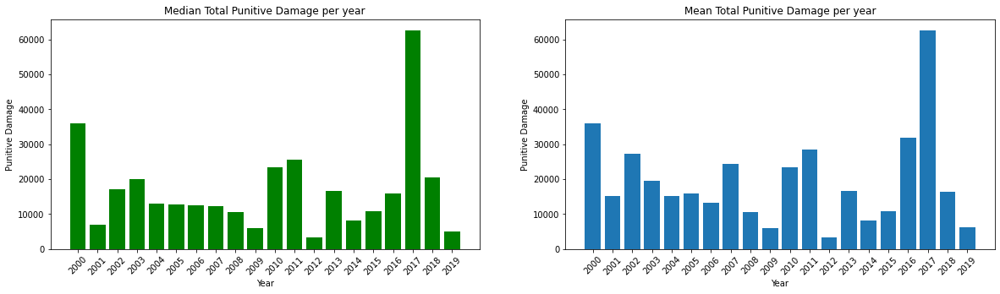

In [192]:
plt.figure(figsize=(20,5))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Punitive'], color = "green")
plt.xlabel('Year')
plt.ylabel('Punitive Damage')
plt.xticks(rotation=45)
plt.title('Median Total Punitive Damage per year')

ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Punitive'])
plt.xlabel('Year')
plt.ylabel('Punitive Damage')
plt.xticks(rotation=45)
plt.title('Mean Total Punitive Damage per year')

Text(0.5, 1.0, 'Mean Total Aggravated Damage per year')

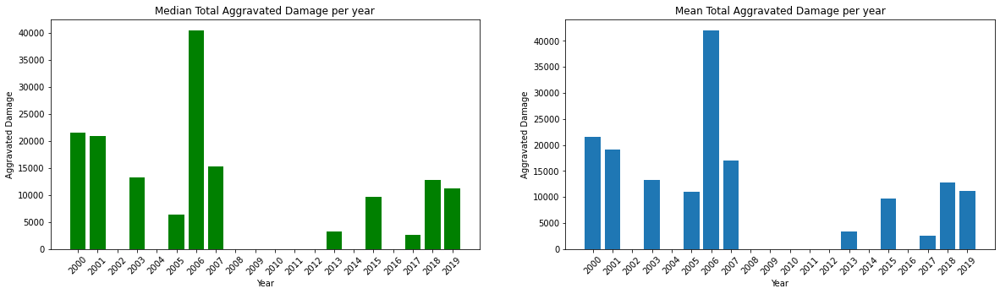

In [193]:
plt.figure(figsize=(20,5))
ax = plt.subplot(1, 2, 1)
df_grouped = inflation_df.groupby('Year').median()
plt.bar(df_grouped.index, df_grouped['Aggravated'], color = "green")
plt.xlabel('Year')
plt.ylabel('Aggravated Damage')
plt.xticks(rotation=45)
plt.title('Median Total Aggravated Damage per year')

ax = plt.subplot(1, 2, 2)
df_grouped = inflation_df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Aggravated'])
plt.xlabel('Year')
plt.ylabel('Aggravated Damage')
plt.xticks(rotation=45)
plt.title('Mean Total Aggravated Damage per year')

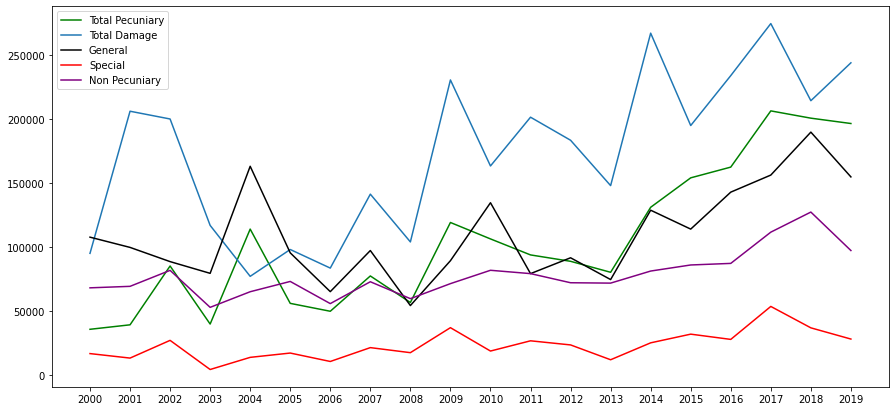

In [194]:
plt.figure(figsize=(15,7))
df_grouped = inflation_df.groupby('Year').median()


plt.plot(df_grouped.index, df_grouped['Total Pecuniary'], color = "green", label="Total Pecuniary")
plt.plot( df_grouped.index, df_grouped['Total Damage'], label="Total Damage")
plt.plot(df_grouped.index, df_grouped['General'], color = "black", label="General")
plt.plot(df_grouped.index, df_grouped['Special'], color = "red", label="Special")
plt.plot(df_grouped.index, df_grouped['Non Pecuniary'], color = "purple", label="Non Pecuniary")

# plt.plot( plt.bar(df_grouped.index, df_grouped['Total Pecuniary']), color='olive', linewidth=2)
# plt.plot( 'x', 'y3', data=df, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")
plt.legend(loc= "upper left")


## smoothed graph

In [199]:
df2 = inflation_df.groupby('Year').median().reset_index()
df2 = smooth_dataframe_column(df2, 'Total Damage', 5)
df2 = smooth_dataframe_column(df2, 'Non Pecuniary', 5)
df2 = smooth_dataframe_column(df2, 'General', 5)
df2 = smooth_dataframe_column(df2, 'Special', 5)
df2 = smooth_dataframe_column(df2, 'Total Pecuniary', 5)


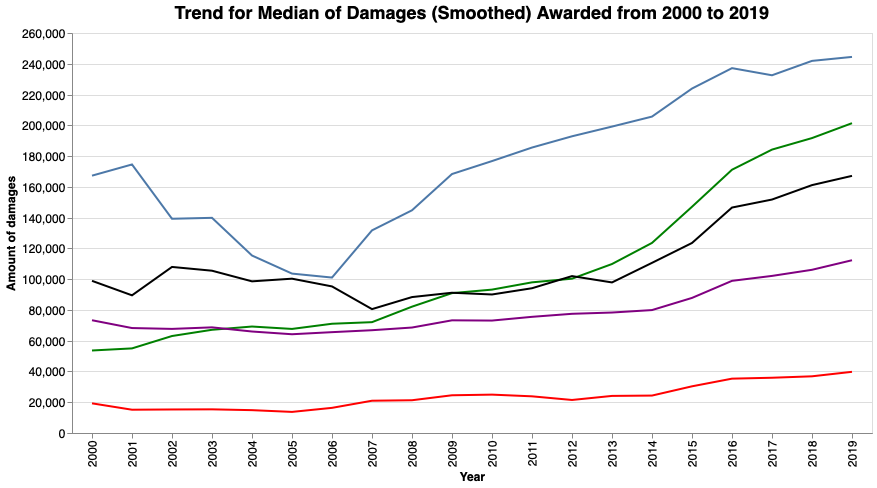

In [200]:
tot_damage = alt.Chart(df2).mark_line().encode(
    alt.X('Year:O'),
    y='Total Damage:Q',
)
tot_Pecuniary = alt.Chart(df2).mark_line(color = "green").encode(
    alt.X('Year:O'),
    y='Total Pecuniary:Q',
)

general = alt.Chart(df2).mark_line(color = "black").encode(
    alt.X('Year:O'),
    y='General:Q',
)

Special = alt.Chart(df2).mark_line(color = "red").encode(
    alt.X('Year:O'),
    y='Special:Q',
)

Non_Pecuniary = alt.Chart(df2).mark_line(color = "purple").encode(
    alt.X('Year:O'),
    y='Non Pecuniary:Q',
)

layers = alt.layer(
    tot_damage, tot_Pecuniary, general, Special, Non_Pecuniary

).properties(title = "Trend for Median of Damages (Smoothed) Awarded from 2000 to 2019",
   width=800, height=400
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
).configure_title(fontSize=18)
layers.layer[0].encoding.y.title = 'Amount of damages'
layers

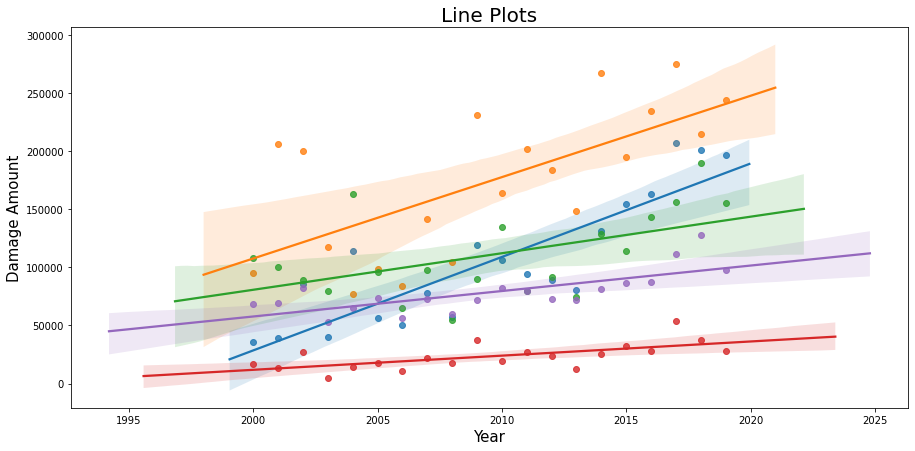

In [202]:
from scipy import stats
plt.figure(figsize=(15,7))
df_grouped = inflation_df.groupby('Year').median()
df_grouped_int = df_grouped.reset_index()
df_grouped_int["Year"] = df_grouped_int["Year"].astype(int)

sns.regplot(x='Year', y='Total Pecuniary', data=df_grouped_int)
sns.regplot(x='Year', y='Total Damage', data=df_grouped_int)
sns.regplot(x='Year', y='General', data=df_grouped_int)
sns.regplot(x='Year', y='Special', data=df_grouped_int)
sns.regplot(x='Year', y='Non Pecuniary', data=df_grouped_int)
plt.title("Line Plots", fontsize = 20)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Damage Amount", fontsize = 15)
plt.show()
# plt.scatter(inflation_df['Year'], inflation_df['Total Pecuniary'], color = "red", label="Total Pecuniary")


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 1.0, 'Mean of Decision Length per year')

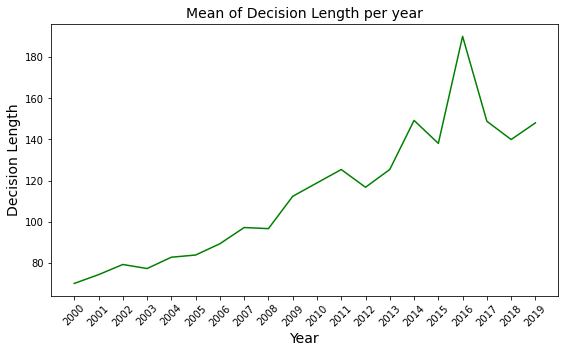

In [203]:
plt.figure(figsize=(20,5))
ax = plt.subplot(1, 2, 1)
df['Decision Length'] = pd.to_numeric(df['Decision Length'])
df_grouped = df.groupby('Year').mean()

plt.plot(df_grouped.index, df_grouped['Decision Length'], color = "green")
plt.xlabel('Year',fontsize= 14)
plt.ylabel('Decision Length',fontsize= 14)
plt.xticks(rotation=45)
plt.title('Mean of Decision Length per year', fontsize= 14)


In [124]:
import pandas as pd
import seaborn as sns


Text(0.5, 1.0, 'Mean Percent Reduction per year')

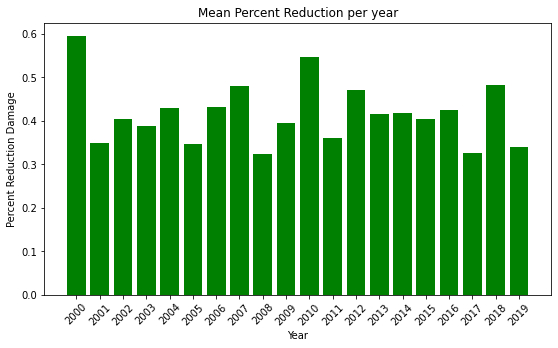

In [204]:
plt.figure(figsize=(20,5))
ax = plt.subplot(1, 2, 1)
df_grouped = df.groupby('Year').mean()
plt.bar(df_grouped.index, df_grouped['Percent Reduction'], color = "green")
plt.xlabel('Year')
plt.ylabel('Percent Reduction Damage')
plt.xticks(rotation=45)
plt.title('Mean Percent Reduction per year')

In [219]:
filtered = inflation_df['Judge Name'].value_counts() > 15
filtered = filtered.reset_index()
judges = filtered[filtered['Judge Name'] == True]['index'].values
df_filtered = df[df['Judge Name'].isin(judges)]




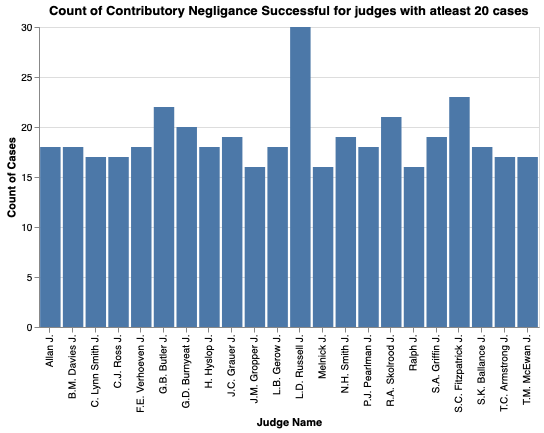

In [222]:
Altair_bar_chart(df_filtered, 'Judge Name:N', 'count(Contributory Negligence Successful):Q', group_by=None , y_title="Count of Cases" ,x_title= "Judge Name"
                 , Title = 'Count of Contributory Negligance Successful for judges with atleast 20 cases', Width= 500, Height = 300 )

In [227]:
E = Altair_bar_chart(df_filtered[df_filtered['Total Damage'] < 30000000], 'mean(Total Damage):Q', 'Judge Name:N', group_by=None , y_title="Judge Name" ,x_title= "Mean total Damage awarded"
                 , Title = 'Mean of Total Damage Awarded for judges with at least 20 case', Width= 500, Height = 400 )

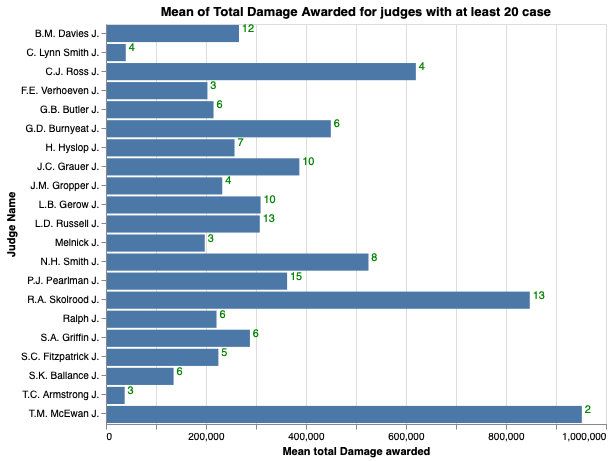

In [228]:
text = E.mark_text(
    align='left',
    baseline='bottom',
    color= 'green',
    dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='count(Total Damage):N')

E + text

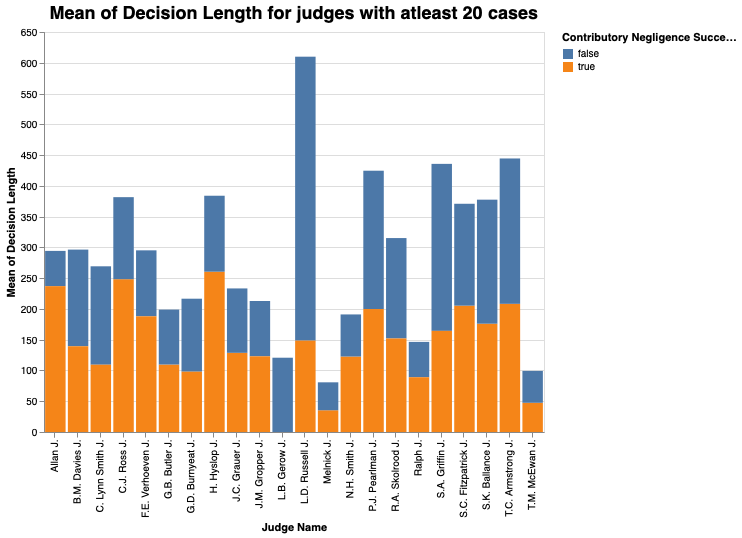

In [233]:
F = Altair_bar_chart(df_filtered, 'Judge Name:N','mean(Decision Length):Q', group_by='Contributory Negligence Successful:N' , y_title="Mean of Decision Length" ,x_title= "Judge Name"
                 ,Title = 'Mean of Decision Length for judges with atleast 20 cases', Width= 500, Height = 400 )
F.configure_title(fontSize=18)

In [235]:
filt = inflation_df['Registry'].value_counts() > 50
filt = filt.reset_index()
Registries = filt[filt['Registry'] == True]['index'].values
df_filtered_reg = df[df['Registry'].isin(Registries)]

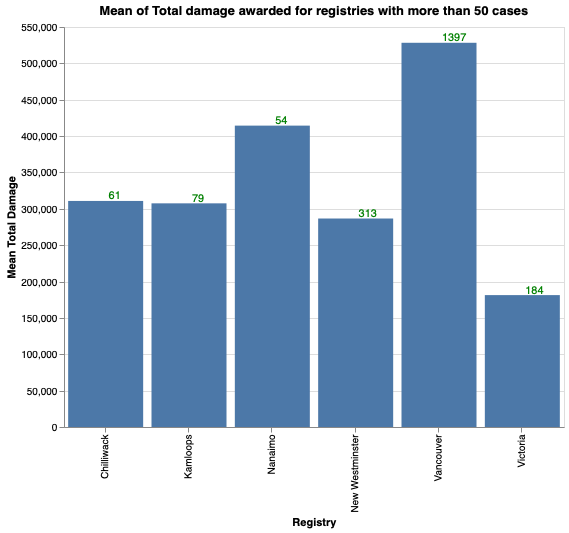

In [244]:
G = Altair_bar_chart(df_filtered_reg, 'Registry:N','mean(Total Damage):Q', group_by=None , y_title="Mean Total Damage" ,x_title= "Registry"
                 ,Title = 'Mean of Total damage awarded for registries with more than 50 cases', Width= 500, Height = 400 )
G_text = G.mark_text(
    align='left',
    baseline='bottom',
    color= 'green',
    dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='count(Index):N')
    
G+G_text

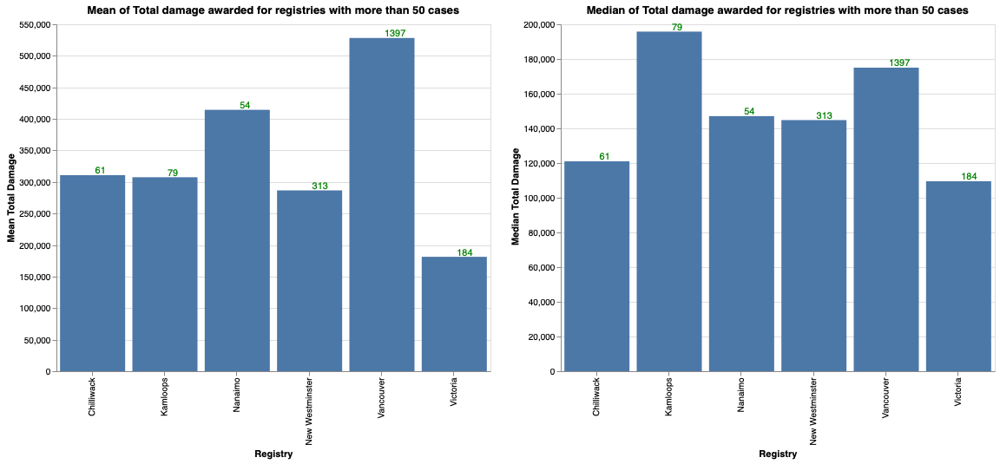

In [246]:
H = Altair_bar_chart(df_filtered_reg, 'Registry:N','median(Total Damage):Q', group_by=None , y_title=" Median Total Damage" ,x_title= "Registry"
                 ,Title = 'Median of Total damage awarded for registries with more than 50 cases', Width= 500, Height = 400 )
text = H.mark_text(
    align='left',
    baseline='bottom',
    color= 'green',
    dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='count(Index):N')
    
G+G_text|H+text 

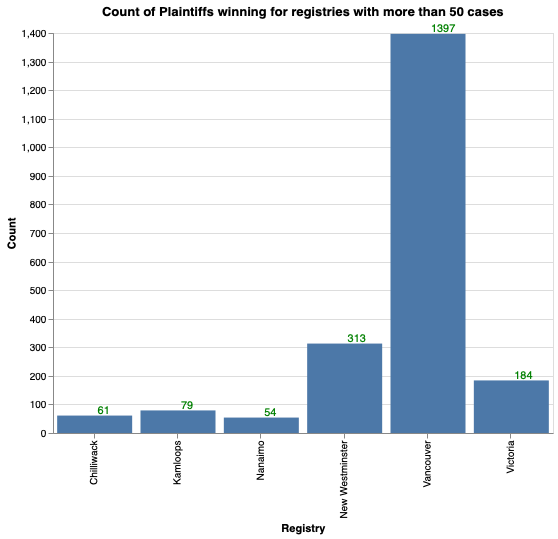

In [250]:
I = Altair_bar_chart(df_filtered_reg, 'Registry:N','count(Plaintiff Wins?):Q', group_by=None , y_title="Count" ,x_title= "Registry"
                 ,Title = 'Count of Plaintiffs winning for registries with more than 50 cases', Width= 500, Height = 400 )
text_I = wins.mark_text(
    align='left',
    baseline='bottom',
    color= 'green',
    dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='count(Plaintiff Wins?):Q'
)


I+text_I